#  STAGE 1: DATA EXPLORATION
Firstly, We start with the imports.

In [90]:
import warnings
warnings.filterwarnings('ignore')

In [91]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import glob
import seaborn as sns
from matplotlib.lines import Line2D
from itertools import product
import plotly.graph_objs as go
import calendar
from statsmodels.tsa.seasonal import seasonal_decompose, STL

# Loading the Data



While initially going through the data, I noticed that some of thr .csv files had a first row of numbers instead of the appropriate labels and these said labels in the second row. So this was fixed in the code below.

In [92]:
Projectfolder = os.path.expanduser("~/Documents/Project_documentation/weatherdata_for_students") #locating the project folder

In [93]:
newdataframe = []
for i in range(1, 129):
    Name = f"brighton_{i:03d}.csv"  # Assuming file names are in the format "data_001.csv", "data_002.csv", etc.
    Path = os.path.join(Projectfolder, Name)
    df = pd.read_csv(Path) # For loop for reading all the brighton_csv files
   
    if df.columns[0].isdigit():  
        df = pd.read_csv(Path, header=1) # while reading the files, if any of them have their first columns headers as digits, it takes the second row as the headers
  
    newdataframe.append(df) # all the files are appended into a new DataFrame
    
Finaldf= pd.concat(newdataframe, ignore_index=True) #The new DataFrame of the appended files are then concatenated to make it a single DataFrame


In [94]:
print("The final DataFrame info:")
print(Finaldf.info())
print("First few rows:")
print(Finaldf.head())
print("The amount of null values are")
print(Finaldf.isnull().sum())

The final DataFrame info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 122844 entries, 0 to 122843
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   datetime          122844 non-null  object 
 1   temp              122590 non-null  float64
 2   dew               122568 non-null  float64
 3   humidity          122575 non-null  float64
 4   precip            122565 non-null  float64
 5   precipprob        122558 non-null  float64
 6   preciptype        11277 non-null   object 
 7   snow              89810 non-null   float64
 8   snowdepth         89279 non-null   float64
 9   windspeed         122583 non-null  float64
 10  winddir           122567 non-null  float64
 11  sealevelpressure  122319 non-null  float64
 12  cloudcover        122556 non-null  float64
 13  solarradiation    122514 non-null  float64
 14  solarenergy       122480 non-null  float64
 15  uvindex           122486 non-null  float64

# Converting the 'datetime' column into datetime type and setting it as the index
Before this was done, I noticed a column called 'preciptype' which told the type of precipitation(rain, snow). 
Assumption: My assumption was that column wasn't needed in the data because the type of precipitation wasn't important if we already knew the precipitation probability, and also, this column had plenty missing values. I decided to drop this column before moving on.

In [95]:
# dropping the 'preciptype' column
Finaldf=Finaldf.drop(columns=['preciptype']) 

In [96]:
# Converting the 'datetime' column to datetime format
Finaldf['datetime'] = pd.to_datetime(Finaldf['datetime'], dayfirst=True, format='mixed') 
# Printing the first and last date in the DataFrame
print(Finaldf['datetime'].min(), Finaldf['datetime'].max()) 

2010-01-01 00:00:00 2024-01-06 11:00:00


In [97]:
# Adding year, month and week of the year columns to the DataFrame
Finaldf['month'] = Finaldf['datetime'].dt.month
Finaldf['year'] = Finaldf['datetime'].dt.year
Finaldf['week_of_year'] = Finaldf['datetime'].dt.isocalendar().week

In [98]:
# Sort the DataFrame by the datetime column
Finaldf.sort_values('datetime', inplace=True)
# make the date column the index of the dataframe for easier slicing
Finaldf.set_index('datetime', inplace=True)

# Plotting the data
Since this data is going to be used to predict if there'll be surplus of energy(wind or solar) 24 hours in advance, I assumed the best colums to use for this prediction would be the 'windspeed' and either the 'solarenergy' or solarradiation'

Baesd on my research, I decided that if you want to predict whether there will be excess energy from the sun for the next 24 hours, you should use solar radiation rather than solar energy. Here's why:
1. Solar radiation measures the power (in W/m²) at the instantaneous moment of observation or forecast prediction. It represents the intensity of sunlight hitting a particular area at a specific time. Using solar radiation data, you can determine the amount of sunlight available at any given moment, which is crucial for understanding solar energy generation potential. Predicting solar radiation can help you forecast short-term fluctuations in sunlight intensity, which is essential for operational decisions in solar energy sytsems
2. Solar Energy: Solar energy (in MJ/m²) indicates the total energy from the sun that builds up over a period, such as an hour or a day. It represents the cumulative amount of sunlight received over a specific timeframe. While solar energy is essential for understanding overall energy accumulation over longer periods, it may not be suitable for predicting short-term fluctuations or excess energy production within the next 24 hours. Solar energy data is more useful for assessing daily or hourly energy generation capacity rather than short-term forecasting.


Therefore, to predict if there will be excess energy from the sun for the next 24 hours, you should focus on forecasting solar radiation, as it provides real-time information about sunlight intensity, which directly influences solar energy generation.


Text(0, 0.5, 'solarradiation')

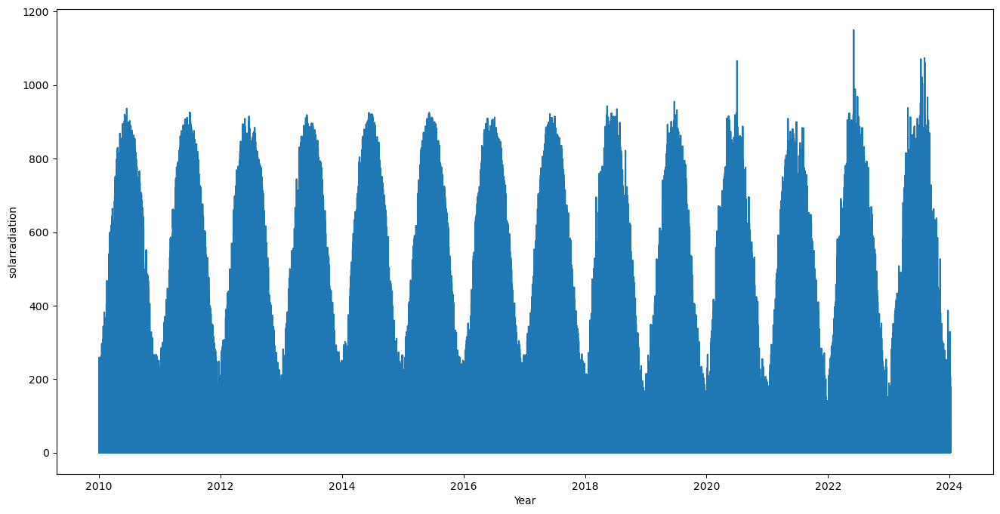

In [99]:
#Plot of solar radiation throught the DataFrame
plt.figure(figsize=(16,8))
plt.plot(Finaldf.index, Finaldf['solarradiation'])
plt.xlabel('Year')
plt.ylabel('solarradiation')

as shown in the solar radiation plot, there is seasonality in solar radiation through out the Dataframe

Text(0, 0.5, 'windspeed')

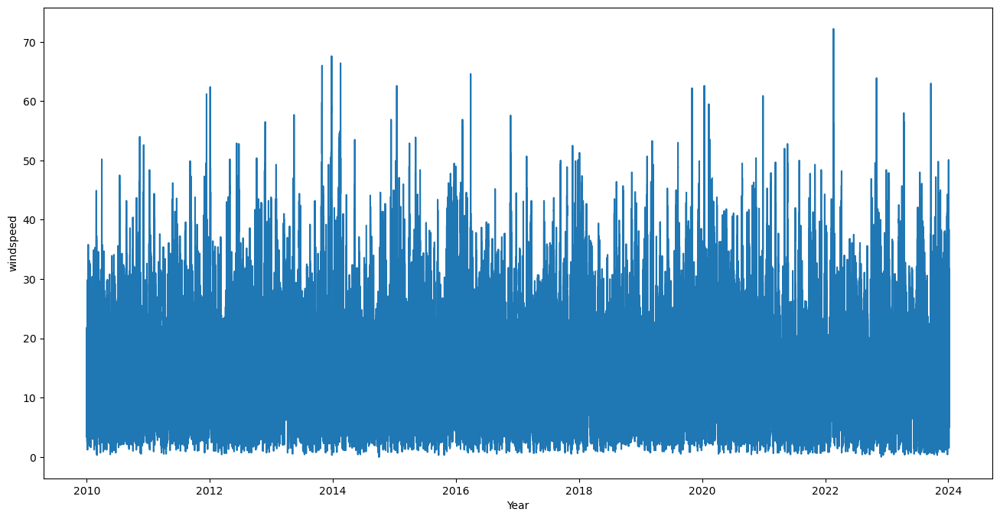

In [100]:
#Plot of windspeed throught the DataFrame
plt.figure(figsize=(16,8))
plt.plot(Finaldf.index, Finaldf['windspeed'])
plt.xlabel('Year')
plt.ylabel('windspeed')

As shown in the wind speed plot, there is no evidence of seasonality as seen in the solarradiation plot. I decided to zoom in to see if i could get more meaning from the plot

Text(0.5, 0, 'Date')

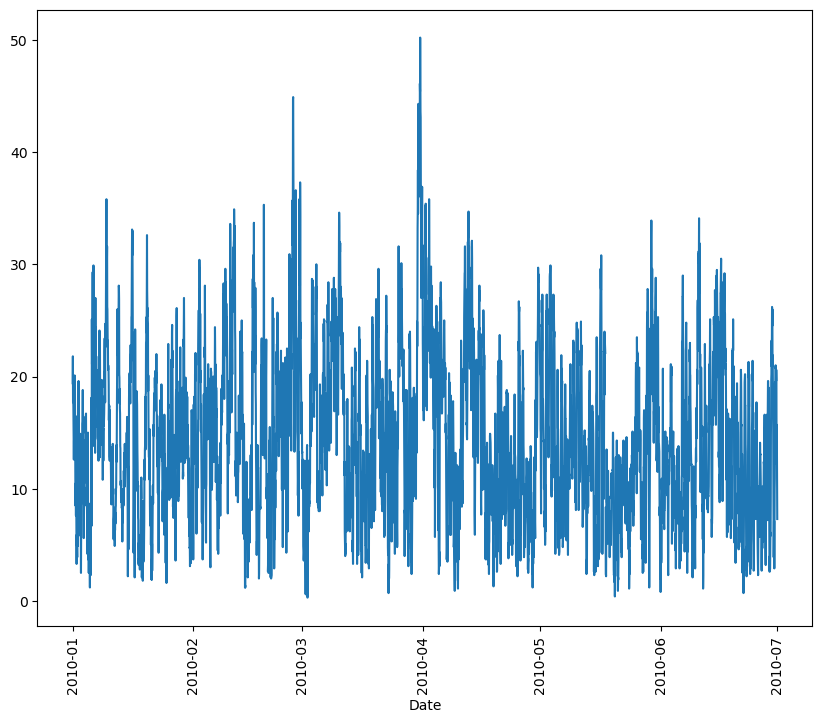

In [101]:
# zoom in to the first six months
Finaldf_ = Finaldf.loc['2010-01-01':'2010-06-30']  # since the date is an index, we can use it to filter our data

plt.figure(figsize=(10, 8))
plt.plot(Finaldf_.index, Finaldf_['windspeed'])
plt.xticks(rotation=90)
plt.xlabel('Date')

as seen there is no form of seasonality for windspeed

# Splitting my data 
Due to the seasonality in solar radiation and irregularity in windspeed, i decided to split my data into the training, validation and test data sets based on datetime. The first 10 years were used as the training data, the next 2 years for validation and the final year as the test data.

In [102]:
## Define split dates (as datetime objects)
split_date_train_end = pd.to_datetime('2019-12-31')
split_date_val_end = pd.to_datetime('2022-12-31')
split_date_test_end = pd.to_datetime('2024-01-06 11:00:00')
# Split the DataFrame
train_data = Finaldf.loc[Finaldf.index <= split_date_train_end]
val_data = Finaldf.loc[(Finaldf.index > split_date_train_end) & (Finaldf.index <= split_date_val_end)]
test_data = Finaldf.loc[(Finaldf.index > split_date_val_end) & (Finaldf.index <= split_date_test_end)]

# Print lengths of each set
print("Number of samples in training set:", len(train_data))
print("Number of samples in validation set:", len(val_data))
print("Number of samples in test set:", len(test_data))

Number of samples in training set: 87625
Number of samples in validation set: 26304
Number of samples in test set: 8915


# Working with the training dataset

Firstly i convert all the columns in float data type

In [103]:
#Converting all the columns in the training data to floats including those that are alrady floats.
for col in train_data.select_dtypes(include=pd.Float64Dtype):
    train_data[col] = train_data[col].astype('float64')
#Printing the data types of each columns
print(train_data.dtypes)

temp                float64
dew                 float64
humidity            float64
precip              float64
precipprob          float64
snow                float64
snowdepth           float64
windspeed           float64
winddir             float64
sealevelpressure    float64
cloudcover          float64
solarradiation      float64
solarenergy         float64
uvindex             float64
month                 int32
year                  int32
week_of_year         UInt32
dtype: object


I decided to drop the snow and snow depth columns.

Assumption: These features are more relevant for assessing potential disruptions to renewable energy production rather than predicting surplus energy. Significant snow depth, or snow probability may reduce the availability of solar radiation and impact wind turbine operation, leading to lower energy production. Unless your location experiences significant snowfall that directly affects solar panel efficiency or wind turbine operation, these features may not have a direct impact on renewable energy production within a 24-hour timeframe.

In [104]:
# Drop the 'snow' and 'snow depth' columns from the training data
train_data.drop(['snow', 'snowdepth'], axis=1, inplace=True)

# Fixing missing values, duplicate dates and missing dates in the training data set
Firstly, I checked for the amount of missing values in each column  

In [105]:
#Printing the total sum of missing values in each column
print(train_data.isnull().sum())

temp                184
dew                 196
humidity            193
precip              184
precipprob          206
windspeed           172
winddir             195
sealevelpressure    337
cloudcover          200
solarradiation      182
solarenergy         214
uvindex             198
month                 0
year                  0
week_of_year          0
dtype: int64


From the values above, I assume that number of missing values in eah column are insignificant considering that there are over 85000 values in each column. So I decided to use linear interpolation to fill in the missing values in each column.

In [106]:
# Interpolate missing values using linear interpolation
train_data['temp'].interpolate(method='linear', inplace=True)
train_data['dew'].interpolate(method='linear', inplace=True)
train_data['humidity'].interpolate(method='linear', inplace=True)
train_data['precip'].interpolate(method='linear', inplace=True)
train_data['precipprob'].interpolate(method='linear', inplace=True)
train_data['windspeed'].interpolate(method='linear', inplace=True)
train_data['winddir'].interpolate(method='linear', inplace=True)
train_data['sealevelpressure'].interpolate(method='linear', inplace=True)
train_data['cloudcover'].interpolate(method='linear', inplace=True)
train_data['solarradiation'].interpolate(method='linear', inplace=True)
train_data['solarenergy'].interpolate(method='linear', inplace=True)
train_data['uvindex'].interpolate(method='linear', inplace=True)

Secondly, I check for duplicate hours in the training data

In [107]:
# Check for duplicate dates in the training data index
duplicate_hours = train_data.index[train_data.index.duplicated()]

# Print duplicate dates
if len(duplicate_hours) > 0:
    print("Duplicate hours in training data:")
    print(duplicate_hours)
else:
    print("No duplicate hours found in training data.")

print (train_data.loc['2010-10-31 01:00:00'])

Duplicate hours in training data:
DatetimeIndex(['2010-10-31 01:00:00', '2011-10-30 01:00:00',
               '2012-10-28 01:00:00', '2013-10-27 01:00:00',
               '2014-10-26 01:00:00', '2015-10-25 01:00:00',
               '2016-10-30 01:00:00', '2017-10-29 01:00:00',
               '2018-10-28 01:00:00', '2019-10-27 01:00:00'],
              dtype='datetime64[ns]', name='datetime', freq=None)
                     temp   dew  humidity  precip  precipprob  windspeed  \
datetime                                                                   
2010-10-31 01:00:00  12.4  10.6     88.49     0.0         0.0       15.0   
2010-10-31 01:00:00  12.4  10.3     87.33     0.0         0.0       17.9   

                     winddir  sealevelpressure  cloudcover  solarradiation  \
datetime                                                                     
2010-10-31 01:00:00    145.0             996.2        34.1             0.0   
2010-10-31 01:00:00    142.0             996.0        2

I fixed the duplicate dates by getting the mean of the data in these dates and using them to fill up those dates as single dates

In [108]:
# If there are duplicate hours, take the mean of the data for each duplicated hour
for hour in duplicate_hours:
    duplicate_rows = train_data[train_data.index == hour] #it iterates over each duplicate hour and selects the corresponding rows from the DataFrame
    mean_data = duplicate_rows.mean() #For each set of duplicate rows, it calculates the mean of the data across all columns.
    train_data = train_data[train_data.index != hour] #remove the original duplicate rows from the DataFrame  
    train_data.loc[hour] = mean_data #inserts a new row with the datetime index and the mean data
# Sort the DataFrame by index
train_data.sort_index(inplace=True)

Thirdly, I check for missing hours

In [109]:
# Generate complete date range covering all hours in your dataset
complete_date_range = pd.date_range(start=train_data.index.min(), end=train_data.index.max(), freq='H')

# Identify missing hours by comparing with actual data index
missing_hours = complete_date_range.difference(train_data.index)

# Print missing hours
if len(missing_hours) > 0:
    print("Missing hours in the dataset:")
    print(missing_hours)
else:
    print("No missing hours found in the dataset.")

Missing hours in the dataset:
DatetimeIndex(['2010-03-28 01:00:00', '2011-03-27 01:00:00',
               '2012-03-25 01:00:00', '2013-03-31 01:00:00',
               '2014-03-30 01:00:00', '2015-03-29 01:00:00',
               '2016-03-27 01:00:00', '2017-03-26 01:00:00',
               '2018-03-25 01:00:00', '2019-03-31 01:00:00'],
              dtype='datetime64[ns]', freq=None)


I used foward fill fix the missing hours

In [110]:
# Reindex the DataFrame with the complete date range
train_data = train_data.reindex(complete_date_range)
# Fill missing values using forward fill (use method='ffill')
train_data = train_data.ffill()

now the data has been successfully cleaned 

# Plotting the training data

I started by plotting all the relevant columns in my training data and comparing them with the wind speed and solar radiation (checking for similarity in trends)

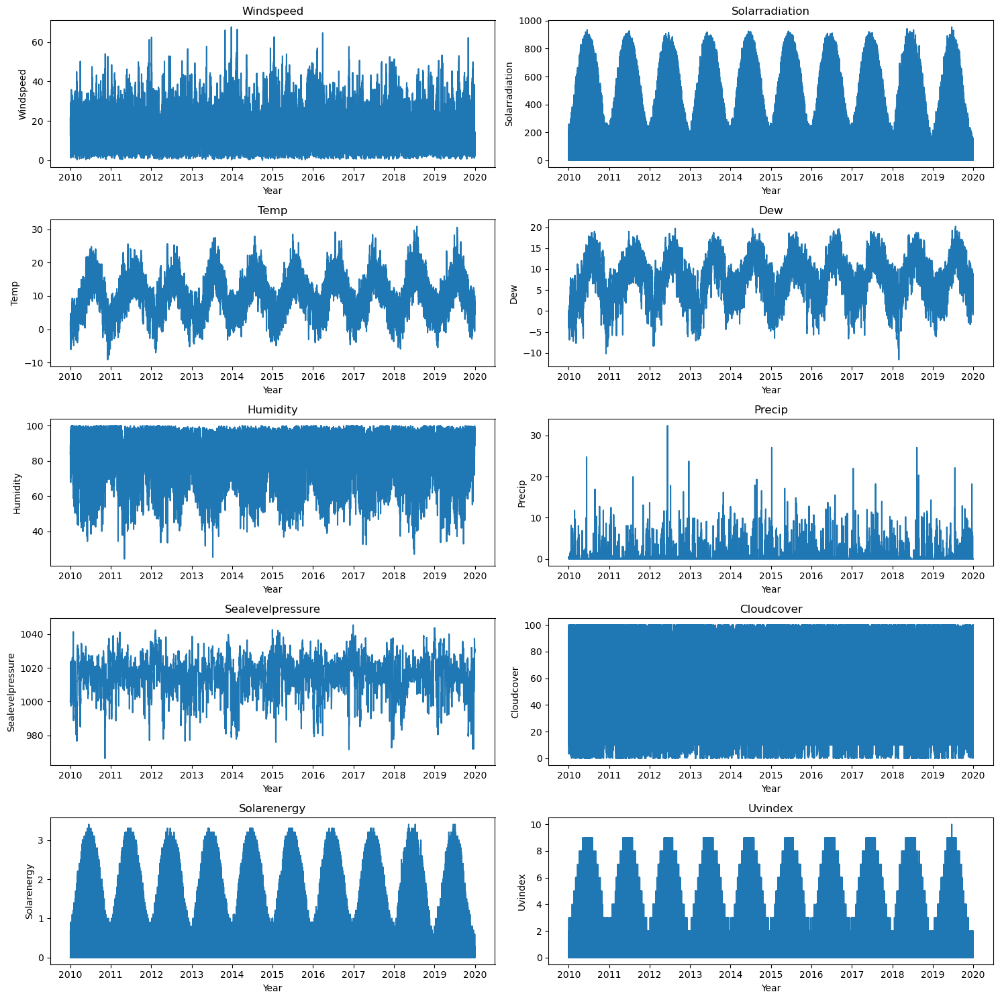

In [111]:
# Create subplots with 5 rows and 2 columns
fig, axs = plt.subplots(5, 2, figsize=(15, 15))

# Flatten the axs array to simplify indexing
axs = axs.flatten()

# Loop through each variable and plot it on a separate subplot
variables = ['windspeed', 'solarradiation', 'temp', 'dew', 'humidity', 
             'precip', 'sealevelpressure', 'cloudcover', 'solarenergy', 'uvindex']

for i, variable in enumerate(variables):
    # Plot the variable on the current subplot
    axs[i].plot(train_data.index, train_data[variable])
    axs[i].set_title(variable.capitalize())  # Set subplot title
    axs[i].set_xlabel('Year')  # Set x-axis label
    axs[i].set_ylabel(variable.capitalize())  # Set y-axis label

# Adjust layout and spacing
plt.tight_layout()
plt.show()

From the above plots, it can be seen that there are similarities in the patterns of solar radiation, temperature, dew, solar energy, and UV index suggest that these variables may be correlated. For example, higher temperatures and increased sunlight (solar radiation) in the summer months may lead to higher levels of solar energy production and UV index.

I plotted a go figure of Solar radiation and Wind speed so i could zoom into any timeframe for better understanding of the data

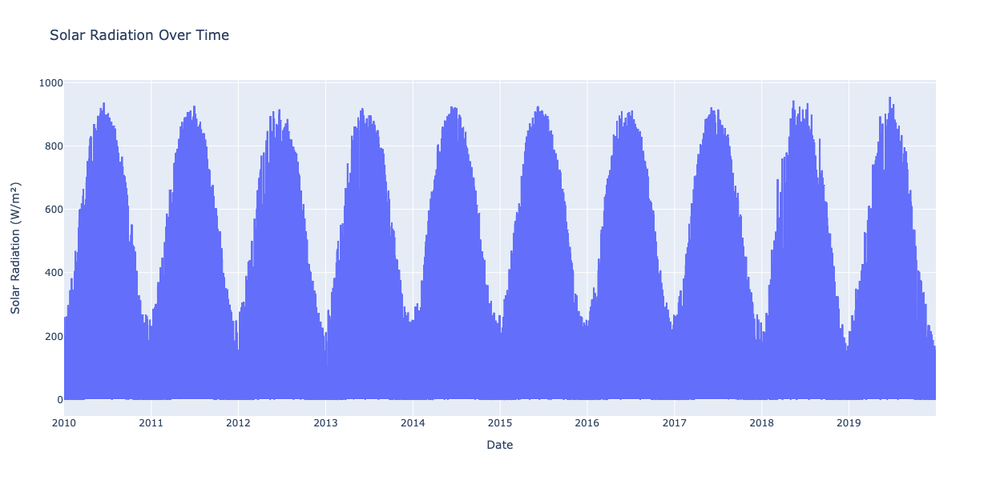

In [112]:
# Create a go.Figure object
fig = go.Figure()

# Add a scatter plot of solar radiation against the index
fig.add_trace(go.Scatter(x=train_data.index, y=train_data['solarradiation'], mode='lines', name='Solar Radiation'))

# Update layout
fig.update_layout(title='Solar Radiation Over Time', xaxis_title='Date', yaxis_title='Solar Radiation (W/m²)', height=600, width=1300)

# Show the plot
fig.show()

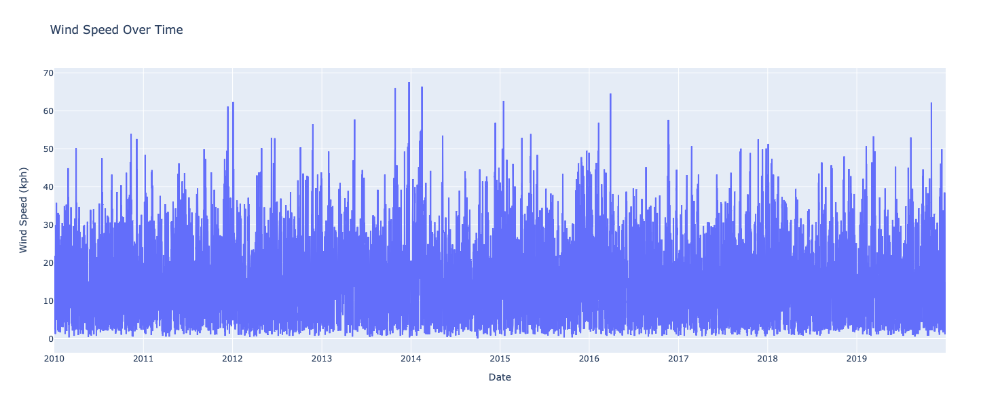

In [113]:
# Create a go.Figure object
fig = go.Figure()

# Add a scatter plot of solar radiation against the index
fig.add_trace(go.Scatter(x=train_data.index, y=train_data['windspeed'], mode='lines', name='Wind Speed'))

# Update layout
fig.update_layout(title='Wind Speed Over Time', xaxis_title='Date', yaxis_title='Wind Speed (kph)', height=600, width=1300)

# Show the plot
fig.show()

Another plot to observe the trends

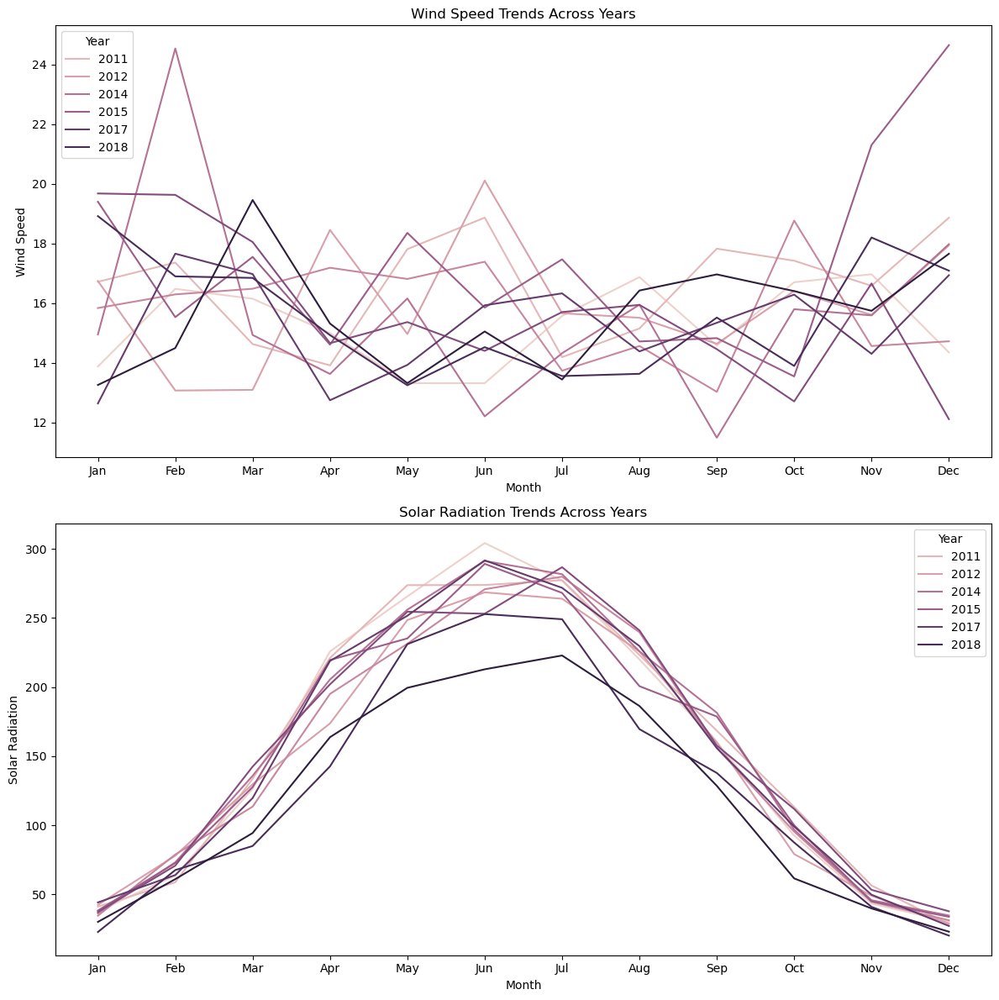

In [114]:
# Extract month and year from the datetime index
train_data['Month'] = train_data.index.month
train_data['Year'] = train_data.index.year

# Define a custom formatter to convert numeric month to month name
def month_formatter(month):
    return calendar.month_abbr[month]

# Create subplots
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 12))  # Set figure size and create subplots

# Plot for wind speed
sns.lineplot(data=train_data, x='Month', y='windspeed', hue='Year', ci=None, ax=axes[0])  # Plot wind speed
axes[0].set_title('Wind Speed Trends Across Years')
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Wind Speed')
axes[0].legend(title='Year')

# Set custom formatter for x-axis labels
axes[0].set_xticks(range(1, 13))
axes[0].set_xticklabels([month_formatter(month) for month in range(1, 13)])

# Plot for solar radiation
sns.lineplot(data=train_data, x='Month', y='solarradiation', hue='Year', ci=None, ax=axes[1])  # Plot solar radiation
axes[1].set_title('Solar Radiation Trends Across Years')
axes[1].set_xlabel('Month')
axes[1].set_ylabel('Solar Radiation')
axes[1].legend(title='Year')

# Set custom formatter for x-axis labels
axes[1].set_xticks(range(1, 13))
axes[1].set_xticklabels([month_formatter(month) for month in range(1, 13)])

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

The above plot shows the irregular pattern of windspeed, which doesn't exhibit clear trends or seasonality, suggests that it is influenced by more unpredictable factors such as local weather patterns, atmospheric pressure systems, and geographical features.
it also shows the seasonal pattern in solar radiation, where it peaks in the summer months and drops in other months, indicates that solar radiation is influenced by factors such as the tilt of the Earth's axis and the position of the sun relative to the Earth.

Decomposing Solar radiation and Wind speed

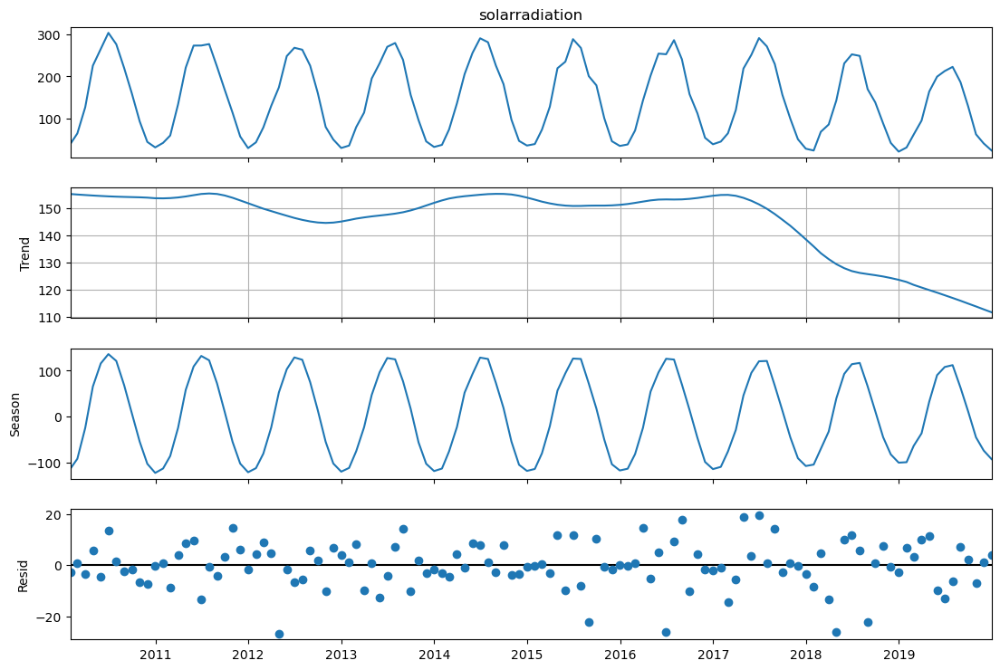

In [115]:
data_ds = train_data['solarradiation'].resample('M').mean().ffill().to_frame()#average solarradiation per month
decomposition = STL(data_ds['solarradiation']).fit()
fig = decomposition.plot()
fig.set_size_inches(12,8)
fig.axes[1].grid() # so we can check a bit better if there's a trend or not

from the trend, average solar radiation per year started dropping from the year 2017.

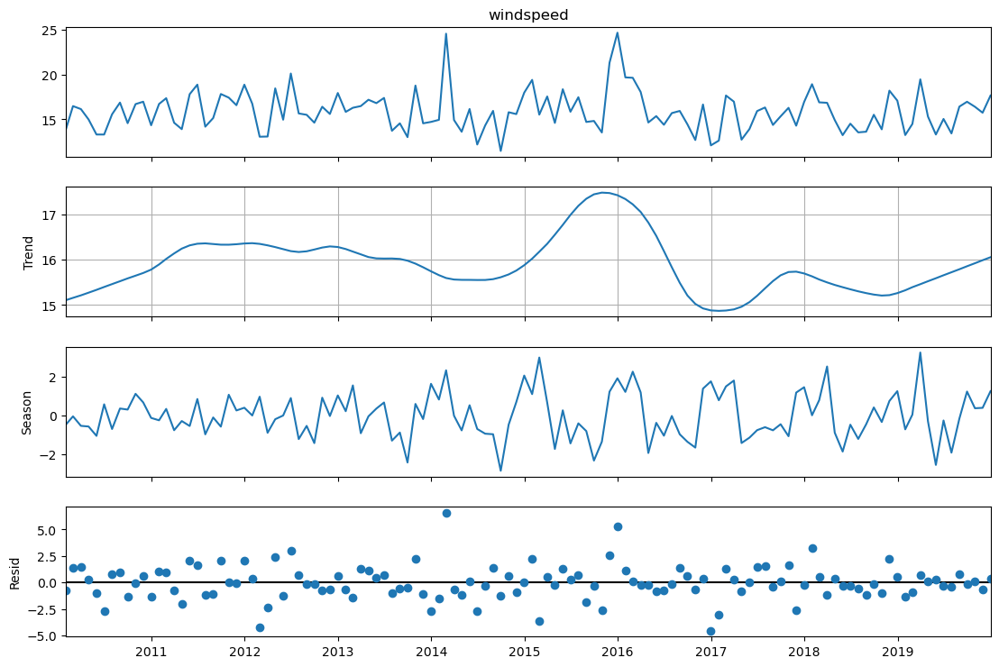

In [116]:
data_dss = train_data['windspeed'].resample('M').mean().ffill().to_frame()  # one value per month
decomposition = STL(data_dss['windspeed']).fit()
fig = decomposition.plot()
fig.set_size_inches(12,8)
fig.axes[1].grid() 

from the trend, the average wind speed peaked from 2015-2016.

# Final Assumptions

Based on the observations I made from my data plots, I can make the following assumptions:

Seasonality of Solar Radiation: The seasonal pattern in solar radiation, where it peaks in the summer months and drops in other months, indicates that solar radiation is influenced by factors such as the tilt of the Earth's axis and the position of the sun relative to the Earth. This seasonality can be attributed to variations in the angle of sunlight reaching the Earth's surface due to changes in the Earth's orbit around the sun. As a result, you can expect solar radiation to follow a similar seasonal pattern in future data. Also from the trend, average solar radiation per year started dropping from the year 2017.

Correlation between Solar Radiation, Temperature, Dew, Solar Energy, and UV Index: The similarities in the patterns of solar radiation, temperature, dew, solar energy, and UV index suggest that these variables may be correlated. For example, higher temperatures and increased sunlight (solar radiation) in the summer months may lead to higher levels of solar energy production and UV index. Understanding these correlations can help in feature selection and model building.

Irregularity of Windspeed: The irregular pattern of windspeed, which doesn't exhibit clear trends or seasonality, suggests that it is influenced by more unpredictable factors such as local weather patterns, atmospheric pressure systems, and geographical features. As a result, predicting windspeed may be more challenging compared to variables with clear seasonal patterns. It was also noticed from the trend that the average wind speed peaked from 2015-2016.

Differences between Solar and Wind Energy: The differences between the patterns of solar radiation and windspeed highlight the distinct characteristics of solar and wind energy sources. Solar energy tends to be more predictable due to its clear seasonal patterns, while wind energy may be more variable and less predictable. This difference should be considered when developing prediction models for excess energy production.


# Applying Data Processing techniques to the Validation and Test sets

In [117]:
#Converting all the columns in the validation data to floats including those that are alrady floats.
for col in val_data.select_dtypes(include=pd.Float64Dtype):
    val_data[col] = val_data[col].astype('float64')
#Printing the data types of each columns
print(val_data.dtypes)

temp                float64
dew                 float64
humidity            float64
precip              float64
precipprob          float64
snow                float64
snowdepth           float64
windspeed           float64
winddir             float64
sealevelpressure    float64
cloudcover          float64
solarradiation      float64
solarenergy         float64
uvindex             float64
month                 int32
year                  int32
week_of_year         UInt32
dtype: object


In [118]:
# Drop the 'snow' and 'snow depth' columns from the validation data
val_data.drop(['snow', 'snowdepth'], axis=1, inplace=True)

In [119]:
#Printing the total sum of missing values in each column
print(val_data.isnull().sum())

temp                 53
dew                  62
humidity             56
precip               64
precipprob           61
windspeed            69
winddir              55
sealevelpressure    175
cloudcover           65
solarradiation       98
solarenergy          87
uvindex             102
month                 0
year                  0
week_of_year          0
dtype: int64


In [120]:
# Interpolate missing values using linear interpolation
val_data['temp'].interpolate(method='linear', inplace=True)
val_data['dew'].interpolate(method='linear', inplace=True)
val_data['humidity'].interpolate(method='linear', inplace=True)
val_data['precip'].interpolate(method='linear', inplace=True)
val_data['precipprob'].interpolate(method='linear', inplace=True)
val_data['windspeed'].interpolate(method='linear', inplace=True)
val_data['winddir'].interpolate(method='linear', inplace=True)
val_data['sealevelpressure'].interpolate(method='linear', inplace=True)
val_data['cloudcover'].interpolate(method='linear', inplace=True)
val_data['solarradiation'].interpolate(method='linear', inplace=True)
val_data['solarenergy'].interpolate(method='linear', inplace=True)
val_data['uvindex'].interpolate(method='linear', inplace=True)

In [121]:
# Check for duplicate dates in the validation data index
duplicate_val_hours = val_data.index[val_data.index.duplicated()]

# Print duplicate dates
if len(duplicate_val_hours) > 0:
    print("Duplicate hours in validation data:")
    print(duplicate_val_hours)
else:
    print("No duplicate hours found in validation data.")

print (val_data.loc['2020-10-25 01:00:00'])

Duplicate hours in validation data:
DatetimeIndex(['2020-10-25 01:00:00', '2021-10-31 01:00:00',
               '2022-10-30 01:00:00'],
              dtype='datetime64[ns]', name='datetime', freq=None)
                     temp   dew  humidity  precip  precipprob  windspeed  \
datetime                                                                   
2020-10-25 01:00:00  11.4   9.6     88.79   0.000         0.0       20.9   
2020-10-25 01:00:00  12.7  10.5     86.37  15.983       100.0       34.0   

                     winddir  sealevelpressure  cloudcover  solarradiation  \
datetime                                                                     
2020-10-25 01:00:00    248.0             997.5        85.1             0.0   
2020-10-25 01:00:00    230.0             996.8        85.7             0.0   

                     solarenergy  uvindex  month  year  week_of_year  
datetime                                                              
2020-10-25 01:00:00          0.0      

In [122]:
# If there are duplicate hours, take the mean of the data for each duplicated hour
for hour in duplicate_val_hours:
    duplicate_val_rows = val_data[val_data.index == hour] #it iterates over each duplicate hour and selects the corresponding rows from the DataFrame
    mean_val_data = duplicate_val_rows.mean() #For each set of duplicate rows, it calculates the mean of the data across all columns.
    val_data = val_data[val_data.index != hour] #remove the original duplicate rows from the DataFrame  
    val_data.loc[hour] = mean_val_data #inserts a new row with the datetime index and the mean data
# Sort the DataFrame by index
val_data.sort_index(inplace=True)

In [123]:
# Generate complete date range covering all hours in your dataset
complete_val_date_range = pd.date_range(start=val_data.index.min(), end=val_data.index.max(), freq='H')

# Identify missing hours by comparing with actual data index
missing_val_hours = complete_val_date_range.difference(val_data.index)

# Print missing hours
if len(missing_val_hours) > 0:
    print("Missing hours in the dataset:")
    print(missing_val_hours)
else:
    print("No missing hours found in the dataset.")

Missing hours in the dataset:
DatetimeIndex(['2020-03-29 01:00:00', '2021-03-28 01:00:00',
               '2022-03-27 01:00:00'],
              dtype='datetime64[ns]', freq=None)


In [124]:
# Reindex the DataFrame with the complete date range
val_data = val_data.reindex(complete_val_date_range)
# Fill missing values using forward fill (use method='ffill')
val_data = val_data.ffill()

TEST SET

In [125]:
#Converting all the columns in the test data to floats including those that are alrady floats.
for col in test_data.select_dtypes(include=pd.Float64Dtype):
    test_data[col] = test_data[col].astype('float64')
#Printing the data types of each columns
print(test_data.dtypes)

temp                float64
dew                 float64
humidity            float64
precip              float64
precipprob          float64
snow                float64
snowdepth           float64
windspeed           float64
winddir             float64
sealevelpressure    float64
cloudcover          float64
solarradiation      float64
solarenergy         float64
uvindex             float64
month                 int32
year                  int32
week_of_year         UInt32
dtype: object


In [126]:
# Drop the 'snow' and 'snow depth' columns from the test data
test_data.drop(['snow', 'snowdepth'], axis=1, inplace=True)

In [127]:
#Printing the total sum of missing values in each column
print(test_data.isnull().sum())

temp                17
dew                 18
humidity            20
precip              31
precipprob          19
windspeed           20
winddir             27
sealevelpressure    13
cloudcover          23
solarradiation      50
solarenergy         63
uvindex             58
month                0
year                 0
week_of_year         0
dtype: int64


In [128]:
# Interpolate missing values using linear interpolation
test_data['temp'].interpolate(method='linear', inplace=True)
test_data['dew'].interpolate(method='linear', inplace=True)
test_data['humidity'].interpolate(method='linear', inplace=True)
test_data['precip'].interpolate(method='linear', inplace=True)
test_data['precipprob'].interpolate(method='linear', inplace=True)
test_data['windspeed'].interpolate(method='linear', inplace=True)
test_data['winddir'].interpolate(method='linear', inplace=True)
test_data['sealevelpressure'].interpolate(method='linear', inplace=True)
test_data['cloudcover'].interpolate(method='linear', inplace=True)
test_data['solarradiation'].interpolate(method='linear', inplace=True)
test_data['solarenergy'].interpolate(method='linear', inplace=True)
test_data['uvindex'].interpolate(method='linear', inplace=True)

In [129]:
# Check for duplicate dates in the test data index
duplicate_test_hours = test_data.index[test_data.index.duplicated()]

# Print duplicate dates
if len(duplicate_test_hours) > 0:
    print("Duplicate hours in test data:")
    print(duplicate_test_hours)
else:
    print("No duplicate hours found in test data.")

Duplicate hours in test data:
DatetimeIndex(['2023-10-29 01:00:00'], dtype='datetime64[ns]', name='datetime', freq=None)


In [130]:
# If there are duplicate hours, take the mean of the data for each duplicated hour
for hour in duplicate_test_hours:
    duplicate_test_rows = test_data[test_data.index == hour] #it iterates over each duplicate hour and selects the corresponding rows from the DataFrame
    mean_test_data = duplicate_test_rows.mean() #For each set of duplicate rows, it calculates the mean of the data across all columns.
    test_data = test_data[test_data.index != hour] #remove the original duplicate rows from the DataFrame  
    test_data.loc[hour] = mean_test_data #inserts a new row with the datetime index and the mean data
# Sort the DataFrame by index
test_data.sort_index(inplace=True)

In [131]:
# Generate complete date range covering all hours in your dataset
complete_test_date_range = pd.date_range(start=test_data.index.min(), end=test_data.index.max(), freq='H')

# Identify missing hours by comparing with actual data index
missing_test_hours = complete_test_date_range.difference(test_data.index)

# Print missing hours
if len(missing_test_hours) > 0:
    print("Missing hours in the dataset:")
    print(missing_test_hours)
else:
    print("No missing hours found in the dataset.")

Missing hours in the dataset:
DatetimeIndex(['2023-03-26 01:00:00'], dtype='datetime64[ns]', freq=None)


In [132]:
# Reindex the DataFrame with the complete date range
test_data = test_data.reindex(complete_test_date_range)
# Fill missing values using forward fill (use method='ffill')
test_data = test_data.ffill()

SAVING THE TRAINING, VALIDATION AND TEST DATA

In [133]:
train_data.to_csv('train_data.csv', index=True)
val_data.to_csv('validation_data.csv', index=True)
test_data.to_csv('test_data.csv', index=True)